In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from einops.layers.torch import Rearrange
from einops import rearrange
import math
import matplotlib.pyplot as plt
import numpy as np

dev = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", dev)

Device: cuda


In [2]:
import odl
import odlpet
from odlpet.scanner.scanner import Scanner
from odlpet.scanner.compression import Compression
from odl.contrib.torch import OperatorModule
from odl.contrib import fom

import time
import warnings
warnings.filterwarnings('ignore')

# ---------------------------
# Unified configuration parameter management
# ---------------------------
config = {
    'image_size': 128,        # Image domain size 128x128
    'patch_size': 32,         # Patch size 32x32 (Thus, a total of (128/32)^2 = 16 patches)
    'num_angles': 512,        # Number of projection angles, determining the number of columns in the sinogram
    'num_detectors': 512,     # Number of detectors, determining the number of rows in the sinogram
    'src_radius': 500,        # Distance from the X-ray source to the center
    'det_radius': 500,        # Distance from the detector to the center
    'mu_water': 0.02          # Attenuation coefficient
}

# ---------------------------
# ODL setup based on parameters from config
# ---------------------------
size = config['image_size']
# The domain coordinate range is fixed at [-128,-128] to [128,128] (adjust according to actual needs)
space = odl.uniform_discr([-128, -128], [128, 128], [size, size],
                           dtype='float32', weighting=1.0)
angle_partition = odl.uniform_partition(0, 2 * np.pi, config['num_angles'])
detector_partition = odl.uniform_partition(-360, 360, config['num_detectors'])
geometry = odl.tomo.FanBeamGeometry(angle_partition, detector_partition, 
                                     src_radius=config['src_radius'], 
                                     det_radius=config['det_radius'])
ray_transform = odl.tomo.RayTransform(space, geometry)
opnorm = odl.power_method_opnorm(ray_transform)
operator = (1 / opnorm) * ray_transform
pseudoinverse = odl.tomo.fbp_op(ray_transform, filter_type='Hann', frequency_scaling=0.45)
mu_water = config['mu_water']

In [3]:
# ---------------------------
# get_indices function: Generate binary masks, sinogram projections, and indices
# ---------------------------
def get_indices(patch_size, s=0, dev='cuda'):
    """
    For an image-domain size of config['image_size'] x config['image_size'],
    patch_size: (height, width) e.g., (32,32)
    s: Threshold, set to 0
    
    Returns:
      stacked_tensor: Tensor [num_patches, max_length, 4], padded indices
      indices: list, each element is the original index tensor (N,4) for a patch (format [0,0,row,col])
      images: np.array, binary masks of each patch in the image domain, shape [num_patches, image_size, image_size]
      sinos: np.array, corresponding sinogram projections for each patch, shape [num_patches, num_detectors, num_angles]
    
    修改后版本：生成的索引格式为 [num_patches, max_length, 2]
    """
    image_shape = (config['image_size'], config['image_size'])
    if image_shape[0] % patch_size[0] != 0 or image_shape[1] % patch_size[1] != 0:
        raise ValueError("Image dimensions must be divisible by the patch size.")
    
    num_patches_grid = (image_shape[0] // patch_size[0], image_shape[1] // patch_size[1])
    num_patches = num_patches_grid[0] * num_patches_grid[1]
    
    images = np.zeros((num_patches, image_shape[0], image_shape[1]))
    sinos = np.zeros((num_patches, config['num_detectors'], config['num_angles']))
    indices = []
    
    print(f"Starting get_indices with {num_patches} patches ...")
    start_total = time.time()
    for k in range(num_patches):
        start_patch = time.time()
        i = k // num_patches_grid[1]
        j = k % num_patches_grid[1]
        images[k, i*patch_size[0]:(i+1)*patch_size[0], j*patch_size[1]:(j+1)*patch_size[1]] = 1
        
        phantom = space.element(images[k])
        phantom /= 1000.0
        data = ray_transform(phantom)
        data = np.exp(-data * mu_water)
        log_data = np.log(data) * (-1 / mu_water) * (1 / opnorm)
        sinos[k] = log_data
        
        index = (torch.tensor(log_data) > s).nonzero()  # shape [N, 4]
        indices.append(index)
        
        end_patch = time.time()
        if (k+1) % 4 == 0 or k == num_patches - 1:
            print(f"Processed patch {k+1}/{num_patches} in {end_patch - start_patch:.2f} sec")
    end_total = time.time()
    print(f"get_indices completed in {end_total - start_total:.2f} sec")
    
    lengths = [len(idx) for idx in indices]
    max_length = max(lengths) if lengths else 0  # 处理空索引
    padded_tensors = [F.pad(idx, (0, 0, max_length - len(idx), 0)) for idx in indices]
    
    stacked_tensor = torch.stack(padded_tensors) if padded_tensors else torch.empty(0, 0, 2)
    print(f"stacked_tensor shape: {stacked_tensor.shape}")
    
    
    return stacked_tensor, indices, images, sinos


Starting get_indices with 16 patches ...
Processed patch 4/16 in 0.42 sec
Processed patch 8/16 in 0.40 sec
Processed patch 12/16 in 0.40 sec
Processed patch 16/16 in 0.42 sec
get_indices completed in 6.50 sec
stacked_tensor shape: torch.Size([16, 62332, 2])


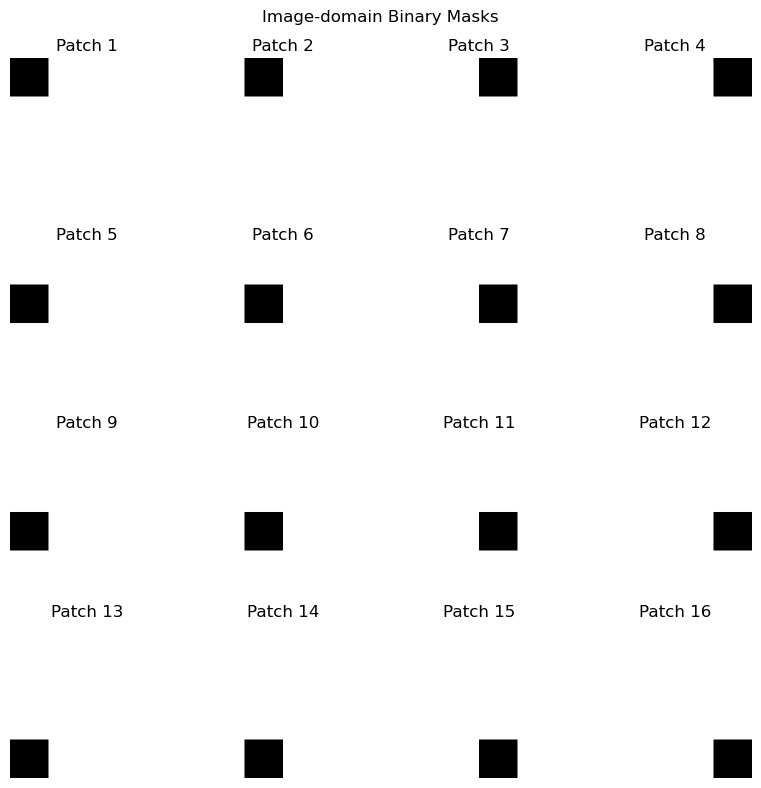

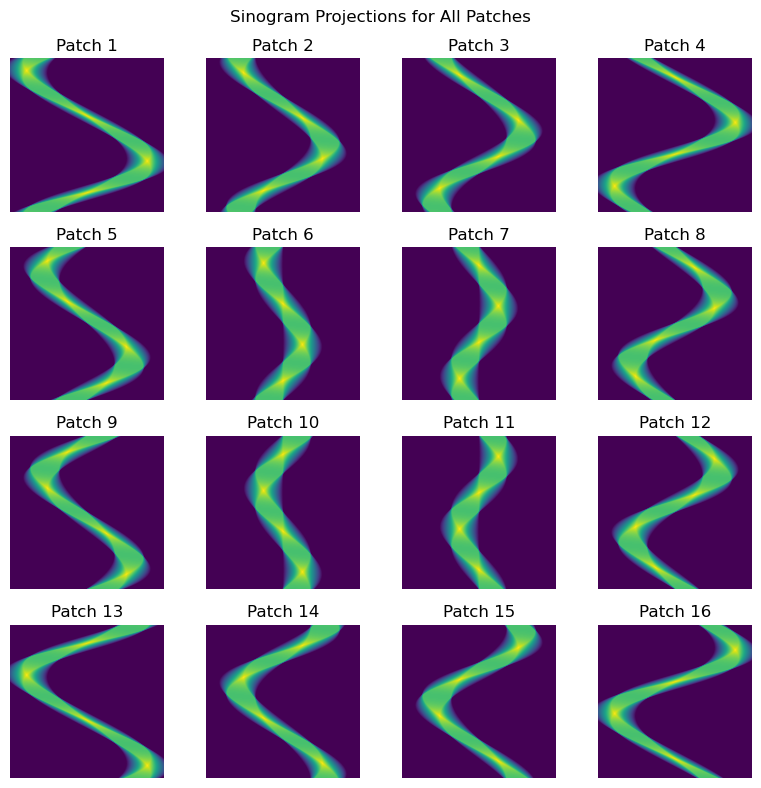

In [4]:
# Call get_indices (patch_size set to (32,32))
patch_size_tuple = (config['patch_size'], config['patch_size'])
stacked_indices, indices_list, images_mask, sinos_phantom = get_indices(patch_size_tuple, s=0, dev='cuda')

# Visualize all image-domain binary mask patches (16 in total)
num_patches = images_mask.shape[0]
n_patches = int(config['image_size']/config['patch_size'])
fig, axes = plt.subplots(n_patches, n_patches, figsize=(8,8))
for idx in range(num_patches):
    ax = axes[idx//n_patches, idx%n_patches]
    ax.imshow(images_mask[idx], cmap='binary')
    ax.set_title(f"Patch {idx+1}")
    ax.axis('off')
plt.suptitle("Image-domain Binary Masks")
plt.tight_layout()
plt.show()

# Visualize all sinogram projections for each patch in a grid layout
num_patches = sinos_phantom.shape[0]
n_patches = int(config['image_size'] / config['patch_size'])
fig, axes = plt.subplots(n_patches, n_patches, figsize=(8,8))
for idx in range(num_patches):
    ax = axes[idx // n_patches, idx % n_patches]
    im = ax.imshow(sinos_phantom[idx], cmap='viridis')
    ax.set_title(f"Patch {idx+1}")
    ax.axis('off')
# Optionally, add a single colorbar for all subplots:
# fig.colorbar(im, ax=axes.ravel().tolist())
plt.suptitle("Sinogram Projections for All Patches")
plt.tight_layout()
plt.show()

In [5]:
# Residual Block Definition
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        """
        Residual Block for building deep neural networks.

        Args:
            in_channels (int): Number of input channels.
            out_channels (int): Number of output channels.
            stride (int): Stride for the convolutional layers.
        """
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        # Shortcut connection to match dimensions if needed
        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels)
            )

    def forward(self, x):
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)  # Add shortcut connection
        out = self.relu(out)
        return out

In [6]:
# ----------------------------
# Transformer Definition
# ----------------------------
class Transformer(nn.Module):
    def __init__(self, head_dim=32, heads=6, dropout=0.3):
        """
        Transformer block for self-attention and MLP layers.
        """
        super(Transformer, self).__init__()
        self.head_dim = head_dim
        self.heads = heads
        self.embedding_dim = heads * head_dim

        self.softmax = nn.Softmax(dim=-1)
        self.Q = nn.Linear(self.embedding_dim, head_dim * heads, bias=False)
        self.K = nn.Linear(self.embedding_dim, head_dim * heads, bias=False)
        self.V = nn.Linear(self.embedding_dim, head_dim * heads, bias=False)

        self.mlp = nn.Sequential(
            nn.Linear(self.embedding_dim, self.embedding_dim),
            nn.ReLU(),
            nn.Linear(self.embedding_dim, self.embedding_dim),
            nn.ReLU()
        )

        self.layernorm = nn.LayerNorm(self.embedding_dim)
        self.dropout = nn.Dropout(dropout)
    
    def forward(self, Z):
        # 计算 Q, K, V
        Q = self.Q(Z)
        K = self.K(Z)
        V = self.V(Z)
        # 注意力得分计算 + dropout
        attn_scores = torch.matmul(Q, K.transpose(-1, -2)) * (self.head_dim ** -0.5)
        attn_probs = self.softmax(attn_scores)
        attn_output = self.dropout(torch.matmul(attn_probs, V))
        # 残差连接和 LayerNorm
        x = self.layernorm(attn_output + Z)
        # MLP + 残差
        x = self.dropout(self.mlp(x))# + x
        return x

In [7]:
# ----------------------------
# CrossTransformer Definition
# ----------------------------
class CrossTransformer(nn.Module):
    def __init__(self, head_dim=32, heads=6, dropout=0.3):
        """
        CrossTransformer：用于 cross attention 的模块
        Args:
            head_dim (int): 每个头的维度。
            heads (int): 注意力头数。
            dropout (float): dropout率。
        """
        super(CrossTransformer, self).__init__()
        self.head_dim = head_dim
        self.heads = heads
        self.embedding_dim = heads * head_dim

        self.softmax = nn.Softmax(dim=-1)
        # 分别对 query 和 key/value 做线性变换
        self.Q = nn.Linear(self.embedding_dim, head_dim * heads, bias=False)
        self.K = nn.Linear(self.embedding_dim, head_dim * heads, bias=False)
        self.V = nn.Linear(self.embedding_dim, head_dim * heads, bias=False)

        self.mlp = nn.Sequential(
            nn.Linear(self.embedding_dim, self.embedding_dim * 2),
            nn.GELU(),
            nn.Linear(self.embedding_dim * 2, self.embedding_dim),
            nn.GELU()
        )
        '''
        self.mlp = nn.Sequential(
            nn.Linear(self.embedding_dim, self.embedding_dim),
            nn.ReLU(),
            nn.Linear(self.embedding_dim, self.embedding_dim),
            nn.ReLU()
        )
        '''
        self.layernorm = nn.LayerNorm(self.embedding_dim)
        self.dropout = nn.Dropout(dropout)
    
    def forward(self, query, key_value):
        # query: [B, seq_len, embed_dim]
        # key_value: [B, seq_len, embed_dim]
        Q = self.Q(query)
        K = self.K(key_value)
        V = self.V(key_value)
        attn_scores = torch.matmul(Q, K.transpose(-1, -2)) * (self.head_dim ** -0.5)
        attn_probs = self.softmax(attn_scores)
        attn_output = self.dropout(torch.matmul(attn_probs, V))
        x = self.layernorm(attn_output + query)
        x = self.dropout(self.mlp(x))# + x
        return x

In [8]:
class DualBranchTransformerModel(nn.Module):
    def __init__(self, indices, embed_dim=128, num_heads=4, num_layers=2, dropout=0.1):
        """
        改造后的等价模型：
        1. 输入处理与 TransformerBlock 一致
        2. 位置编码、嵌入方式与 TransformerBlock 对齐
        3. 数据写回逻辑使用向量化操作
        4. Transformer 层严格遵循 Pre-LN 结构
        """
        super(DualBranchTransformerModel, self).__init__()
        # --- 关键修改 1：索引格式对齐 ---
        # 原始 TransformerBlock 的 indices 格式为 [num_patches, patch_length, 2]
        # 这里强制要求 indices 必须符合该格式
        assert indices.dim() == 3 and indices.size(-1) == 2, "indices must be [num_patches, patch_length, 2]"
        self.indices = indices  # [num_patches, patch_length, 2]
        self.num_patches = indices.shape[0]
        self.patch_length = indices.shape[1]
        self.in_channels = 1  # 与 TransformerBlock 的输入通道一致

        # --- 关键修改 2：嵌入层对齐 ---
        # 将 (c p) 维度映射到 embedding_dim（保留通道信息）
        self.embedding_dim = embed_dim
        self.H = nn.Sequential(
            nn.Linear(self.patch_length * self.in_channels, self.embedding_dim),  # 与 TransformerBlock 的 (c p) 对应
            nn.LayerNorm(self.embedding_dim)
        )

        # --- 关键修改 3：位置编码对齐 ---
        # 编码维度 [num_patches * in_channels, embedding_dim]
        self.positional_encodings = nn.Parameter(
            torch.randn(self.num_patches * self.in_channels, self.embedding_dim)
        )

        # --- 关键修改 4：Transformer 层对齐 ---
        self.transformer_layers = nn.Sequential(*[
            Transformer(head_dim=embed_dim // num_heads, heads=num_heads, dropout=dropout)
            for _ in range(num_layers)
        ])

        # --- 关键修改 5：Tail 层与数据写回对齐 ---
        self.tail = nn.Sequential(
            nn.Linear(self.embedding_dim, self.patch_length * self.in_channels),
            nn.ReLU(),
            Rearrange('(b s) (c p) v -> b c p v s', p=self.num_patches, s=1)
        )

        # --- 关键修改 6：残差块对齐 ---
        self.residualBlock = nn.Sequential(
            Rearrange('b c h w s -> (b s) c h w'),
            ResidualBlock(in_channels=self.in_channels, out_channels=self.in_channels),
            Rearrange('(b s) c h w -> b c h w s', s=1)
        )

    def forward(self, sino, kernel=None):  # 保持接口不变，但忽略 kernel
        """
        改造后的数据流：
        1. 输入处理与 TransformerBlock 的 forward 完全一致
        2. 忽略 kernel 分支
        """
        B, C, H, W = sino.shape
        assert C == self.in_channels, f"Input channel must be {self.in_channels}"

        # --- 步骤 1：与 TransformerBlock 相同的输入处理 ---
        sino = sino.unsqueeze(-1)  # [B, C, H, W, 1]
        encodings = sino[:, :, self.indices[..., 0], self.indices[..., 1], :]  # [B, C, num_patches, patch_length, 1]
        
        # --- 步骤 2：嵌入与位置编码对齐 ---
        encodings_flat = rearrange(encodings, 'b c p v s -> (b s) (c p) v')
        H_emb = self.H(encodings_flat)  # [B*1, num_patches*C, embed_dim]
        
        # 位置编码扩展方式对齐 TransformerBlock
        Z = H_emb + self.positional_encodings.repeat(B, 1, 1)  # [B, num_patches*C, embed_dim]

        # --- 步骤 3：Transformer 处理 ---
        Z = self.transformer_layers(Z)

        # --- 步骤 4：数据写回对齐 ---
        out = self.tail(Z)  # [B, C, num_patches, patch_length, 1]
        
        # 向量化写回（避免循环）
        sino_clone = sino.clone()
        sino_clone[:, :, self.indices[..., 0], self.indices[..., 1], :] += out
        sino = sino_clone

        # --- 步骤 5：残差块处理 ---
        sino = self.residualBlock(sino).squeeze(-1)
        return sino

sino_input shape: torch.Size([1, 1, 512, 512])
kernel_input shape: torch.Size([1, 1, 512, 512])
stacked_indices shape: torch.Size([16, 62332, 4])
[Debug] Input sino shape: torch.Size([1, 1, 512, 512])
[Debug] Indices shape: torch.Size([16, 62332, 4])
[Debug] Indices expanded shape: torch.Size([1, 16, 62332, 4])
[Debug] Encodings shape after unsqueeze: torch.Size([1, 1, 16, 62332, 1])
[Debug] Encodings flat shape: torch.Size([1, 16, 62332])
Output sinogram shape: torch.Size([1, 1, 512, 512])


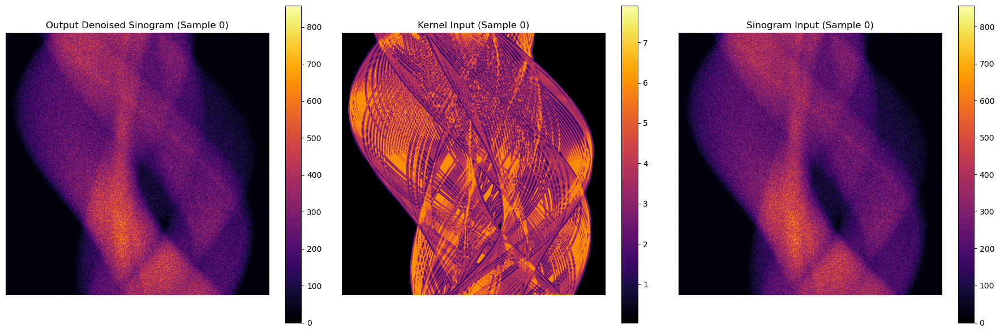

In [9]:
# ---------------------------
# Test Code: Testing with a saved dataset
# ---------------------------
# Load the saved dataset
dataset_dict = torch.load("pet_ct_dataset_1_tensor.pt")
pet_sinograms_noised_cpu = dataset_dict['pet_sinograms_noised']  # List, each element has shape (512,512)
kernels_ct_cpu = dataset_dict['ct_sinograms_kernel']             # List, each element has shape (512,512)

# Convert list to tensor and add channel dimension: Final shape [N, 1, 512, 512] (for sinograms)
#sino_input = torch.stack([x for x in pet_sinograms_noised_cpu], dim=0).unsqueeze(1)
# Convert list to tensor and add channel dimension: Final shape [N, 1, 512, 512] (for kernels)
#kernel_input = torch.stack([x for x in kernels_ct_cpu], dim=0).unsqueeze(1)

sino_input = dataset_dict['pet_sinograms_noised'][0].unsqueeze(0).unsqueeze(0)   # [1, 1, 512, 512]
kernel_input = dataset_dict['ct_sinograms_kernel'][0].unsqueeze(0).unsqueeze(0)   # [1, 1, 512, 512]

#sino_input = torch.stack(pet_sinograms_noised_cpu[:32], dim=0).unsqueeze(1)
#kernel_input = torch.stack(kernels_ct_cpu[:32], dim=0).unsqueeze(1)

print("sino_input shape:", sino_input.shape)
print("kernel_input shape:", kernel_input.shape)

sino_input = sino_input.to(dev)
# kernel_input = kernel_input.to(dev)
kernel_input = kernel_input.to(dev)

print("stacked_indices shape:", stacked_indices.shape)

# Create model instance
model = DualBranchTransformerModel(indices=stacked_indices, embed_dim=128, num_heads=4, num_layers=2, dropout=0.1)
model = model.to(dev)

# Forward pass
sino_out = model(sino_input, kernel_input)
print("Output sinogram shape:", sino_out.shape)

# Visualize three images (output, kernel input, sinogram input) in one row
out_np = sino_out[0, 0].detach().cpu().numpy()
kernel_np = kernel_input[0, 0].detach().cpu().numpy()
sino_input_np = sino_input[0, 0].detach().cpu().numpy()

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot output sinogram
im0 = axes[0].imshow(out_np, cmap='inferno')
axes[0].set_title("Output Denoised Sinogram (Sample 0)")
axes[0].axis('off')
fig.colorbar(im0, ax=axes[0])

# Plot kernel input
im1 = axes[1].imshow(kernel_np, cmap='inferno')
axes[1].set_title("Kernel Input (Sample 0)")
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1])

# Plot sinogram input
im2 = axes[2].imshow(sino_input_np, cmap='inferno')
axes[2].set_title("Sinogram Input (Sample 0)")
axes[2].axis('off')
fig.colorbar(im2, ax=axes[2])

plt.tight_layout()
plt.show()

In [9]:
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# ---------------------------
# Custom Dataset for Training
# ---------------------------
class PETCTTrainDataset(Dataset):
    def __init__(self, dataset_dict):
        """
        dataset_dict: Contains the following keys:
            'pet_sinograms_noised': list of PET sinograms (each [128,128])
            'pet_sinograms_clean': list of clean PET sinograms (each [128,128])
            'kernels_ct': list of CT-derived kernels (each [128,128])
        """
        self.pet_sinograms_noised = dataset_dict['pet_sinograms_noised']
        self.pet_sinograms_clean = dataset_dict['pet_sinograms_clean']
        self.kernels_ct = dataset_dict['ct_sinograms_kernel']
        
    def __len__(self):
        return len(self.pet_sinograms_noised)
    
    def __getitem__(self, idx):
        # Add channel dimension, changing shape to [1,H,W]
        sino_noised = self.pet_sinograms_noised[idx].unsqueeze(0)
        sino_clean  = self.pet_sinograms_clean[idx].unsqueeze(0)
        kernel      = self.kernels_ct[idx].unsqueeze(0)
        return sino_noised, sino_clean, kernel

dataset_dict = torch.load("pet_ct_dataset_1_tensor.pt")
train_dataset = PETCTTrainDataset(dataset_dict)
print(f"Verification passed, total sample: {len(train_dataset)}")

Verification passed, total sample: 2000


In [42]:
from torch.cuda.amp import autocast, GradScaler
# ---------------------------
# Training configuration
# ---------------------------
training_config = {
    'lr': 1e-4,               # 参考前辈代码使用更大学习率
    'num_epochs': 50,
    'batch_size': 64,         # 增大batch size
    'num_workers': 8,         # 数据加载进程数
    'grad_accum_steps': 2,    # 梯度累积步数
    'max_grad_norm': 5.0,     # 梯度裁剪阈值
    'mixed_precision': False  # 强制启用混合精度
}

train_loader = DataLoader(
        train_dataset,
        batch_size=training_config['batch_size'],
        shuffle=True,
        num_workers=0
    )

# 4. 最小训练测试
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = DualBranchTransformerModel(indices=stacked_indices, embed_dim=128, num_heads=8, num_layers=2, dropout=0.1)
model = model.to(device)

# ---------------------------
# Define Weight Decay Parameters
# ---------------------------
no_decay = []
decay = []

for name, param in model.named_parameters():
    # 需要同时满足以下两个条件才进行衰减：
    # 1. 是权重参数（'weight'在name中）
    # 2. 不属于归一化层（'batchnorm'和'layernorm'不在name中）
    if 'weight' in name and not any(n in name for n in ['batchnorm', 'layernorm', 'relative_bias_table']):
        decay.append(param)
    else:
        no_decay.append(param)

# ---------------------------
# Optimized Parameter Initialization
# ---------------------------
def init_weights(m):
    if isinstance(m, (nn.Conv2d, nn.Linear)):
        nn.init.normal_(m.weight, mean=0.0, std=0.02)  # 参考前辈初始化
        if m.bias is not None:
            nn.init.zeros_(m.bias)
model.apply(init_weights)

# ---------------------------
# Memory-Efficient Optimizer
# ---------------------------
optimizer = optim.AdamW(
    [
        {'params': decay, 'weight_decay': 0.01},  # 应用权重衰减
        {'params': no_decay, 'weight_decay': 0}    # 不应用衰减
    ],
    lr=training_config['lr'],
    foreach=True
)

# ---------------------------
# Enhanced Mixed Precision Training
# ---------------------------
scaler = GradScaler(
    init_scale=2**15,       # 增大初始缩放因子
    growth_interval=200,    # 减少缩放频率
    enabled=training_config['mixed_precision']
)


Epoch [1/50], Avg Loss: 1577.3614
Epoch [2/50], Avg Loss: 1568.6344
Epoch [3/50], Avg Loss: 1563.6206
Epoch [4/50], Avg Loss: 1560.0582
Epoch [5/50], Avg Loss: 1552.1891
Epoch [6/50], Avg Loss: 1547.6445
Epoch [7/50], Avg Loss: 1547.8848
Epoch [8/50], Avg Loss: 1543.2758
Epoch [9/50], Avg Loss: 1540.4795
Epoch [10/50], Avg Loss: 1539.3976


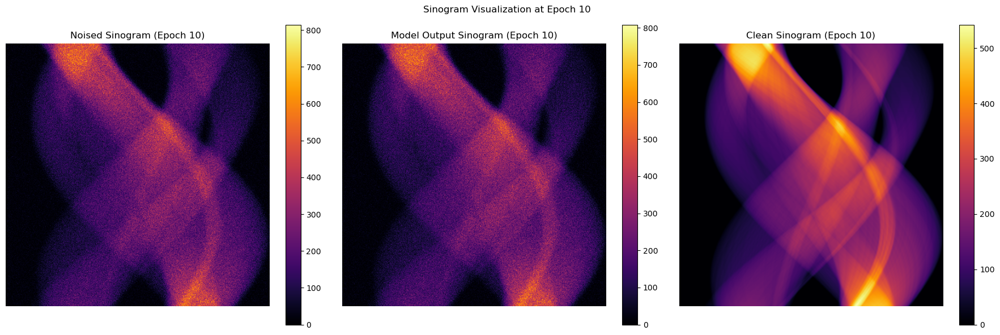

Epoch [11/50], Avg Loss: 1535.2437
Epoch [12/50], Avg Loss: 1537.7497
Epoch [13/50], Avg Loss: 1529.9083
Epoch [14/50], Avg Loss: 1529.4301
Epoch [15/50], Avg Loss: 1535.2693
Epoch [16/50], Avg Loss: 1529.4918
Epoch [17/50], Avg Loss: 1529.4738
Epoch [18/50], Avg Loss: 1530.5063
Epoch [19/50], Avg Loss: 1534.2806
Epoch [20/50], Avg Loss: 1531.1556


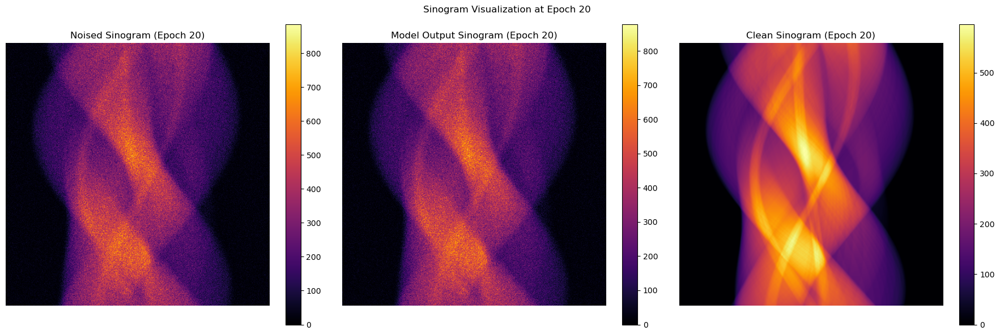

Epoch [21/50], Avg Loss: 1530.0916
Epoch [22/50], Avg Loss: 1528.6995
Epoch [23/50], Avg Loss: 1528.8759
Epoch [24/50], Avg Loss: 1525.9020
Epoch [25/50], Avg Loss: 1531.2188
Epoch [26/50], Avg Loss: 1528.1253
Epoch [27/50], Avg Loss: 1529.9173
Epoch [28/50], Avg Loss: 1527.4782
Epoch [29/50], Avg Loss: 1529.0811
Epoch [30/50], Avg Loss: 1523.0211


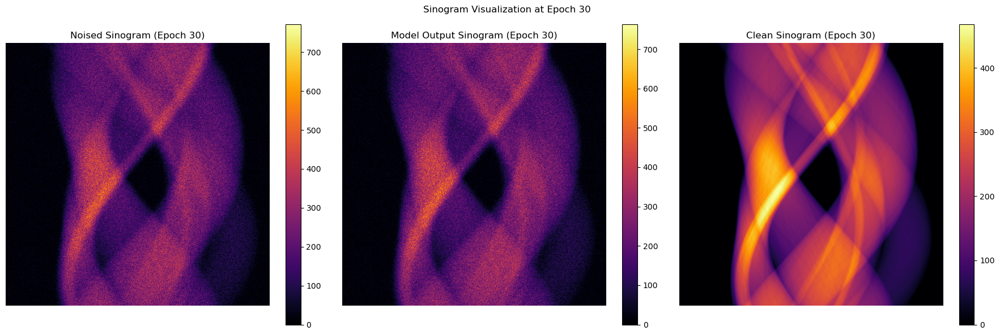

Epoch [31/50], Avg Loss: 1527.6459
Epoch [32/50], Avg Loss: 1527.2142
Epoch [33/50], Avg Loss: 1525.5752
Epoch [34/50], Avg Loss: 1526.2687
Epoch [35/50], Avg Loss: 1527.0500
Epoch [36/50], Avg Loss: 1527.4335
Epoch [37/50], Avg Loss: 1528.6089
Epoch [38/50], Avg Loss: 1526.2894
Epoch [39/50], Avg Loss: 1527.1048
Epoch [40/50], Avg Loss: 1528.3308


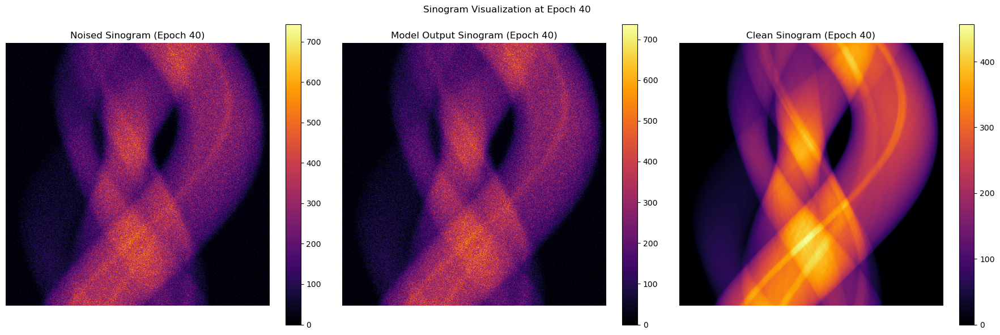

Epoch [41/50], Avg Loss: 1522.6418
Epoch [42/50], Avg Loss: 1522.9065
Epoch [43/50], Avg Loss: 1527.1799
Epoch [44/50], Avg Loss: 1519.0206
Epoch [45/50], Avg Loss: 1524.1984
Epoch [46/50], Avg Loss: 1525.2018
Epoch [47/50], Avg Loss: 1529.5328
Epoch [48/50], Avg Loss: 1526.8749
Epoch [49/50], Avg Loss: 1527.0607
Epoch [50/50], Avg Loss: 1523.0765


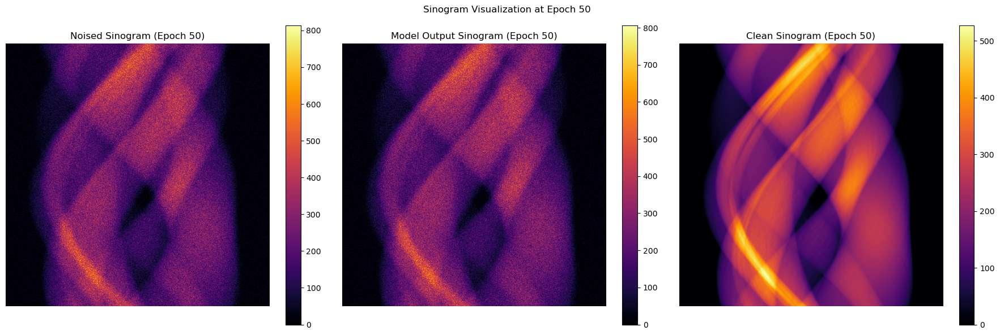

In [43]:
# ---------------------------
# Training Loop
# ---------------------------
num_epochs = training_config['num_epochs']
model.train()

for epoch in range(num_epochs):
    running_loss = 0.0
    accumulation_steps = training_config['grad_accum_steps']
    
    for batch_idx, (sino_noised, sino_clean, kernel) in enumerate(train_loader):

        sino_noised = sino_noised.to(device)
        sino_clean = sino_clean.to(device)
        kernel = kernel.to(device)

        #sino_noised = (sino_noised - sino_noised.mean(dim=[2, 3], keepdim=True)) / sino_noised.std(dim=[2, 3], keepdim=True)
        #sino_clean = (sino_clean - sino_clean.mean(dim=[2, 3], keepdim=True)) / sino_clean.std(dim=[2, 3], keepdim=True)

        optimizer.zero_grad()
        
        with autocast(training_config['mixed_precision']):  # 混合精度
            outputs = model(sino_noised, kernel)
            loss = torch.nn.functional.mse_loss(outputs, sino_clean)  # 不除 accumulation_steps
            #loss = combined_loss(outputs, sino_clean)
            loss = loss / accumulation_steps
    
        scaler.scale(loss).backward()

        # **监测梯度 norm**
        #for name, param in model.named_parameters():
        #    if param.grad is not None:
        #        print(f"{name} | grad norm: {torch.norm(param.grad).item()}")
        
        if (batch_idx + 1) % accumulation_steps == 0 or (batch_idx + 1) == len(train_loader):
            torch.nn.utils.clip_grad_norm_(model.parameters(), training_config['max_grad_norm'])  # 梯度裁剪
            scaler.step(optimizer)  # 进行梯度更新
            scaler.update()  # 更新 scaler 以防止梯度爆炸
            optimizer.zero_grad()  # 清空梯度

        running_loss += loss.item()

    avg_loss = running_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{num_epochs}], Avg Loss: {avg_loss:.4f}")
    
    # 异步验证和保存
    if (epoch + 1) % 10 == 0:
        model.eval()
        with torch.no_grad():
            sample_output = model(sino_noised, kernel)
    
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # 创建 1 行 3 列的子图
    
        # 画出带噪声的 sinogram
        im0 = axes[0].imshow(sino_noised[0, 0].detach().cpu().numpy(), cmap='inferno')
        axes[0].set_title(f"Noised Sinogram (Epoch {epoch+1})")
        axes[0].axis('off')
        fig.colorbar(im0, ax=axes[0])
    
        # 画出模型输出的 sinogram
        im1 = axes[1].imshow(sample_output[0, 0].detach().cpu().numpy(), cmap='inferno')
        axes[1].set_title(f"Model Output Sinogram (Epoch {epoch+1})")
        axes[1].axis('off')
        fig.colorbar(im1, ax=axes[1])
    
        # 画出干净的 sinogram
        im2 = axes[2].imshow(sino_clean[0, 0].detach().cpu().numpy(), cmap='inferno')
        axes[2].set_title(f"Clean Sinogram (Epoch {epoch+1})")
        axes[2].axis('off')
        fig.colorbar(im2, ax=axes[2])
    
        plt.suptitle(f"Sinogram Visualization at Epoch {epoch+1}")
        plt.tight_layout()
        plt.show()
    
        model.train()  # 重新进入训练模式
        
        with torch.no_grad():
            sample_output = model(sino_noised[:1], kernel[:1])  # 使用最后批次
        # 异步保存检查点
        torch.save(model.state_dict(), f"checkpoint_epoch{epoch+1}.pth")

In [10]:
# ---------------------------
# Training configuration
# ---------------------------
training_config = {
    'lr': 5e-5,               # Learning rate
    'num_epochs': 50,         # Number of training epochs
    'batch_size': 128          # Batch size
}

# ---------------------------
# Create Dataset and DataLoader for sinogram-only training
# ---------------------------
train_loader = DataLoader(
        train_dataset,
        batch_size=training_config['batch_size'],
        shuffle=True,
        num_workers=0  # 关键修复点
    )

# ---------------------------
# Create Model Instance and Move to Device
# ---------------------------
# 使用之前定义的 TransformerBlock
model = DualBranchTransformerModel(indices=stacked_indices, embed_dim=128, num_heads=8, num_layers=2, dropout=0.1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# ---------------------------
# Define Optimizer: Adam
# ---------------------------
optimizer = optim.Adam(model.parameters(), lr=training_config['lr'])


In [11]:
# ---------------------------
# Define SSIM Loss and Mixed Loss Function
# ---------------------------
def gaussian(window_size, sigma):
    gauss = torch.Tensor([np.exp(-(x - window_size//2)**2/float(2*sigma**2)) for x in range(window_size)])
    return gauss/gauss.sum()

def create_window(window_size, channel):
    _1D_window = gaussian(window_size, 1.5).unsqueeze(1)
    _2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
    window = _2D_window.expand(channel, 1, window_size, window_size).contiguous()
    return window

def ssim(img1, img2, window_size=8, size_average=True):
    channel = img1.size(1)
    window = create_window(window_size, channel).to(img1.device)
    
    mu1 = F.conv2d(img1, window, padding=window_size//2, groups=channel)
    mu2 = F.conv2d(img2, window, padding=window_size//2, groups=channel)
    
    mu1_sq = mu1.pow(2)
    mu2_sq = mu2.pow(2)
    mu1_mu2 = mu1 * mu2
    
    sigma1_sq = F.conv2d(img1*img1, window, padding=window_size//2, groups=channel) - mu1_sq
    sigma2_sq = F.conv2d(img2*img2, window, padding=window_size//2, groups=channel) - mu2_sq
    sigma12 = F.conv2d(img1*img2, window, padding=window_size//2, groups=channel) - mu1_mu2
    
    C1 = 0.01**2
    C2 = 0.03**2
    
    ssim_map = ((2*mu1_mu2 + C1)*(2*sigma12 + C2)) / ((mu1_sq+mu2_sq+C1)*(sigma1_sq+sigma2_sq+C2))
    return ssim_map.mean() if size_average else ssim_map.mean(1).mean(1).mean(1)

class SSIMLoss(nn.Module):
    def __init__(self, window_size=11, size_average=True):
        super(SSIMLoss, self).__init__()
        self.window_size = window_size
        self.size_average = size_average
    def forward(self, img1, img2):
        return 1 - ssim(img1, img2, self.window_size, self.size_average)

mse_loss = nn.MSELoss()
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True)

def mixed_loss(output, target, mse_weight=0.5, ssim_weight=0.5):
    loss_mse = mse_loss(output, target)
    loss_ssim = ssim_loss_fn(output, target)
    return mse_weight * loss_mse + ssim_weight * loss_ssim

Epoch [1/50], Loss: 631.0795
Epoch [2/50], Loss: 630.0161
Epoch [3/50], Loss: 631.0799
Epoch [4/50], Loss: 630.7992
Epoch [5/50], Loss: 631.1755
Epoch [6/50], Loss: 630.0199
Epoch [7/50], Loss: 631.0634
Epoch [8/50], Loss: 631.0222
Epoch [9/50], Loss: 630.4170
Epoch [10/50], Loss: 630.5778


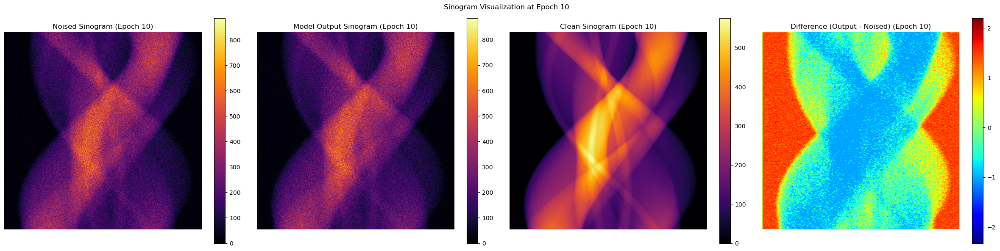

Epoch [11/50], Loss: 629.6829
Epoch [12/50], Loss: 630.6455
Epoch [13/50], Loss: 630.2002
Epoch [14/50], Loss: 629.8752
Epoch [15/50], Loss: 629.9669
Epoch [16/50], Loss: 629.6631
Epoch [17/50], Loss: 629.9417
Epoch [18/50], Loss: 629.8715
Epoch [19/50], Loss: 629.4521
Epoch [20/50], Loss: 629.4401


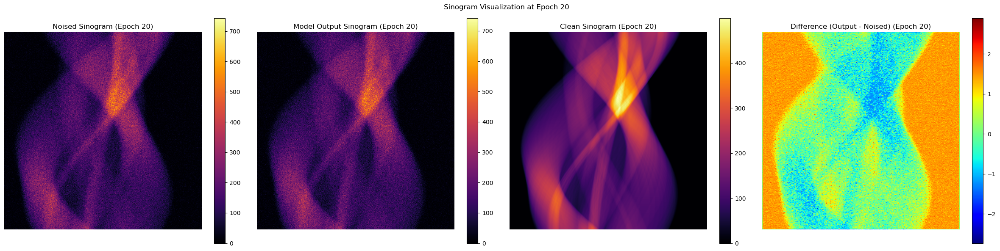

Epoch [21/50], Loss: 629.6202
Epoch [22/50], Loss: 628.8220
Epoch [23/50], Loss: 628.3645
Epoch [24/50], Loss: 628.4708
Epoch [25/50], Loss: 628.4747
Epoch [26/50], Loss: 628.5599
Epoch [27/50], Loss: 627.7210
Epoch [28/50], Loss: 627.8793
Epoch [29/50], Loss: 627.1928


KeyboardInterrupt: 

In [12]:
# ---------------------------
# Training Loop
# ---------------------------
num_epochs = training_config['num_epochs']
model.train()

for epoch in range(num_epochs):
    running_loss = 0.0
    
    for batch_idx, (sino_noised, sino_clean, kernel) in enumerate(train_loader):
        sino_noised = sino_noised.to(dev)
        sino_clean = sino_clean.to(dev)
        kernel = kernel.to(dev)
        
        optimizer.zero_grad()
        outputs = model(sino_noised, kernel)
        
        #loss = torch.nn.functional.mse_loss(outputs, sino_clean)
        loss = mixed_loss(outputs, sino_clean, 0.2, 0.8)

        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
    
    avg_loss = running_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}")
    
    # 异步验证和保存
    if (epoch + 1) % 10 == 0:
        model.eval()
        with torch.no_grad():
            sample_output = model(sino_noised, kernel)
    
        fig, axes = plt.subplots(1, 4, figsize=(24, 6))
    
        # 画出带噪声的 sinogram
        im0 = axes[0].imshow(sino_noised[0, 0].detach().cpu().numpy(), cmap='inferno')
        axes[0].set_title(f"Noised Sinogram (Epoch {epoch+1})")
        axes[0].axis('off')
        fig.colorbar(im0, ax=axes[0])
        
        # 画出模型输出的 sinogram
        im1 = axes[1].imshow(sample_output[0, 0].detach().cpu().numpy(), cmap='inferno')
        axes[1].set_title(f"Model Output Sinogram (Epoch {epoch+1})")
        axes[1].axis('off')
        fig.colorbar(im1, ax=axes[1])
        
        # 画出干净的 sinogram
        im2 = axes[2].imshow(sino_clean[0, 0].detach().cpu().numpy(), cmap='inferno')
        axes[2].set_title(f"Clean Sinogram (Epoch {epoch+1})")
        axes[2].axis('off')
        fig.colorbar(im2, ax=axes[2])
        
        # 计算并显示输出与噪声图像之间的差值
        diff = sample_output - sino_noised
        im3 = axes[3].imshow(diff[0, 0].detach().cpu().numpy(), cmap='jet')
        axes[3].set_title(f"Difference (Output - Noised) (Epoch {epoch+1})")
        axes[3].axis('off')
        fig.colorbar(im3, ax=axes[3])
        
        plt.suptitle(f"Sinogram Visualization at Epoch {epoch+1}")
        plt.tight_layout()
        plt.show()
    
        model.train()  # 重新进入训练模式
        
        with torch.no_grad():
            sample_output = model(sino_noised[:1], kernel[:1])  # 使用最后批次
        # 异步保存检查点
        torch.save(model.state_dict(), f"checkpoint_epoch{epoch+1}.pth")

Validation PSNR: 20.41, SSIM: 0.1209


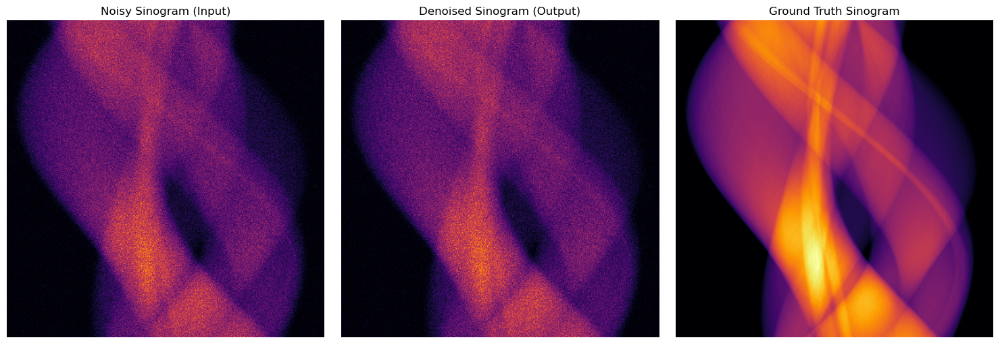

DualBranchTransformerModel(
  (H): Sequential(
    (0): Linear(in_features=62332, out_features=128, bias=True)
    (1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
  )
  (transformer_layers): Sequential(
    (0): Transformer(
      (softmax): Softmax(dim=-1)
      (Q): Linear(in_features=128, out_features=128, bias=False)
      (K): Linear(in_features=128, out_features=128, bias=False)
      (V): Linear(in_features=128, out_features=128, bias=False)
      (mlp): Sequential(
        (0): Linear(in_features=128, out_features=128, bias=True)
        (1): ReLU()
        (2): Linear(in_features=128, out_features=128, bias=True)
        (3): ReLU()
      )
      (layernorm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (1): Transformer(
      (softmax): Softmax(dim=-1)
      (Q): Linear(in_features=128, out_features=128, bias=False)
      (K): Linear(in_features=128, out_features=128, bias=False)
      (V): Linear(in

In [20]:
def validate(model, val_loader):
    model.eval()
    total_psnr = 0.0
    total_ssim = 0.0
    count = 0
    with torch.no_grad():
        for sino_noised, sino_clean, kernel in val_loader:
            sino_noised = sino_noised.to(dev)
            sino_clean = sino_clean.to(dev)
            kernel = kernel.to(dev)
            output = model(sino_noised, kernel)
            # Compute metrics: PSNR and SSIM, assuming you have implemented fom.psnr and fom.ssim
            for i in range(output.size(0)):
                out_np = output[i,0].detach().cpu().numpy()
                target_np = sino_clean[i,0].detach().cpu().numpy()
                psnr_val = fom.psnr(out_np, target_np)
                ssim_val = fom.ssim(out_np, target_np)
                total_psnr += psnr_val
                total_ssim += ssim_val
                count += 1
        avg_psnr = total_psnr / count
        avg_ssim = total_ssim / count
    model.train()
    return avg_psnr, avg_ssim

# Assuming you have split the dataset into train and val, below demonstrates how to use DataLoader for validation:
# For example, using PETCTTrainDataset for validation (you may need a separate validation dataset in practice)
val_dataset = PETCTTrainDataset(dataset_dict)
val_loader = DataLoader(val_dataset, batch_size=training_config['batch_size'], shuffle=False)

# Load a saved model (as shown in the checkpoint loading code above)
# Then perform validation
avg_psnr, avg_ssim = validate(model, val_loader)
print(f"Validation PSNR: {avg_psnr:.2f}, SSIM: {avg_ssim:.4f}")

# Set the model to evaluation mode
model.eval()
with torch.no_grad():
    # Take the first sample from the validation set for visualization
    sample_noised, sample_clean, sample_kernel = val_dataset[0]
    # Add batch dimension: [1, 1, 128, 128]
    sample_noised = sample_noised.unsqueeze(0).to(dev)
    sample_clean  = sample_clean.unsqueeze(0).to(dev)
    sample_kernel = sample_kernel.unsqueeze(0).to(dev)
    
    # Forward pass to get network output
    sample_output = model(sample_noised, sample_kernel)

# Convert to numpy array and remove batch and channel dimensions
noisy_np  = sample_noised[0, 0].detach().cpu().numpy()
output_np = sample_output[0, 0].detach().cpu().numpy()
gt_np     = sample_clean[0, 0].detach().cpu().numpy()

# Create a triptych for display
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(noisy_np, cmap='inferno')
axs[0].set_title("Noisy Sinogram (Input)")
axs[0].axis('off')

axs[1].imshow(output_np, cmap='inferno')
axs[1].set_title("Denoised Sinogram (Output)")
axs[1].axis('off')

axs[2].imshow(gt_np, cmap='inferno')
axs[2].set_title("Ground Truth Sinogram")
axs[2].axis('off')

plt.tight_layout()
plt.show()

# Restore model to training mode (if further training is needed)
model.train()

In [21]:
# save checkpoint
checkpoint_path = "model_ViT_kernel_latest.pth"
torch.save({
    'epoch': total_epochs,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': avg_loss,
}, checkpoint_path)
print(f"Model checkpoint saved to {checkpoint_path}")

Model checkpoint saved to model_ViT_latest.pth
